In [1]:
# load packages
import pandas as pd
import numpy as np
import altair as alt
import random

In [2]:
# !pip install wordcloud

In [3]:
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
import matplotlib.pyplot as plt

In [4]:
# read in US_youtube_trending_data

# US_youtube_trending_data = pd.read_csv('/home/jovyan/pstat100-w22-content/project/US_youtube_trending_data.csv')

# US_youtube_trending_data = pd.read_csv(r'C:\Users\ameyer\Documents\PSTAT100FinalProject\US_youtube_trending_data.csv')

US_youtube_trending_data = pd.read_csv('/Users/harleen/Desktop/PSTAT100FinalProjectH/US_youtube_trending_data.csv')

In [5]:
# read in US_category_id json that has categoryId info

# US_category_id = pd.read_json('/home/jovyan/pstat100-w22-content/project/US_category_id.json')
# US_category_id = pd.read_json(r'C:\Users\ameyer\Documents\PSTAT100FinalProject\US_category_id.json')

#US_category_id = pd.read_json(r'C:\Users\candy\Documents\PSTAT100FinalProject\US_category_id.json')

In [6]:
# convert json to csv

#US_category_id.to_csv('US_category_id.csv')

In [7]:
# print first couple rows of US_youtube_trending_data 

US_youtube_trending_data.head(4)

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description
0,3C66w5Z0ixs,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11T19:20:14Z,UCvtRTOMP2TqYqu51xNrqAzg,Brawadis,22,2020-08-12T00:00:00Z,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,https://i.ytimg.com/vi/3C66w5Z0ixs/default.jpg,False,False,SUBSCRIBE to BRAWADIS ▶ http://bit.ly/Subscrib...
1,M9Pmf9AB4Mo,Apex Legends | Stories from the Outlands – “Th...,2020-08-11T17:00:10Z,UC0ZV6M2THA81QT9hrVWJG3A,Apex Legends,20,2020-08-12T00:00:00Z,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,https://i.ytimg.com/vi/M9Pmf9AB4Mo/default.jpg,False,False,"While running her own modding shop, Ramya Pare..."
2,J78aPJ3VyNs,I left youtube for a month and THIS is what ha...,2020-08-11T16:34:06Z,UCYzPXprvl5Y-Sf0g4vX-m6g,jacksepticeye,24,2020-08-12T00:00:00Z,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,https://i.ytimg.com/vi/J78aPJ3VyNs/default.jpg,False,False,I left youtube for a month and this is what ha...
3,kXLn3HkpjaA,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11T16:38:55Z,UCbg_UMjlHJg_19SZckaKajg,XXL,10,2020-08-12T00:00:00Z,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,https://i.ytimg.com/vi/kXLn3HkpjaA/default.jpg,False,False,Subscribe to XXL → http://bit.ly/subscribe-xxl...


In [8]:
# cells are free

# next you have to define categoryId
# variable analysis
# missingness?
# What to get rid of?
# which couple of variables would be the best for analysis? We can change our decision later.

In [9]:
# gathered from documentation
# these are the only genres that are trending; there are others but they aren't even in the dataset
genres = {1: 'Film & Animation', 2:'Autos & Vehicles ',10 : 'Music', 15 : 'Pets & Animals', 17 : 'Sports', 18 : 'Short Movies', 19 : 'Travel & Events', 20 : 'Gaming', 21 : 'Videoblogging',
         22 : 'People & Blogs', 23 : 'Comedy', 24 : 'Entertainment', 25 : 'News & Politics', 26 : 'Howto & Style', 27 : 'Education', 28 : 'Science & Technology', 29 : 'Nonprofits & Activism', 
          30 : 'Movies', 31 : 'Anime/Animation'}

In [10]:
# replace categoryId numbers with genre dict
US_youtube_trending_data['categoryId'] = US_youtube_trending_data.categoryId.replace(genres)

In [11]:
# dropping some columns 

US_youtube_trending_data = US_youtube_trending_data.drop(columns=['video_id', 'channelId', 'thumbnail_link', 'description']) 

In [12]:
# storing month and year, we can discuss how we should actually store it
# not sure how altair works with datetimes

#published date
US_youtube_trending_data['publishedAt'] = pd.to_datetime(US_youtube_trending_data['publishedAt'])

US_youtube_trending_data['publishedAt'] = US_youtube_trending_data['publishedAt'].dt.strftime('%Y-%m-%d')
US_youtube_trending_data['PublishedYear'] = pd.DatetimeIndex(US_youtube_trending_data['publishedAt']).year
US_youtube_trending_data['PublishedMonth'] = pd.DatetimeIndex(US_youtube_trending_data['publishedAt']).month

#trending date
US_youtube_trending_data['trending_date'] = pd.to_datetime(US_youtube_trending_data['trending_date'])

US_youtube_trending_data['trending_date'] = US_youtube_trending_data['trending_date'].dt.strftime('%Y-%m-%d')
US_youtube_trending_data['TrendingYear'] = pd.DatetimeIndex(US_youtube_trending_data['trending_date']).year
US_youtube_trending_data['TrendingMonth'] = pd.DatetimeIndex(US_youtube_trending_data['trending_date']).month

In [13]:
# rename columns to match formatting 
US_youtube_trending_data.rename(
    columns={
    "publishedAt":"date_published", "channelTitle": "channel_name", "categoryId": "category", "PublishedYear":"year_published",
    "PublishedMonth":"month_published", "TrendingYear": "year_trending", "TrendingMonth":"month_trending"
    }, inplace = True)

# print first few rows of dataset
US_youtube_trending_data.head(3)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,False,False,2020,8,2020,8
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,False,False,2020,8,2020,8
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,False,False,2020,8,2020,8


In [14]:
# export tidy data as csv

US_youtube_trending_data.to_csv('trending.csv')

In [15]:
# load new csv

# trending = pd.read_csv('/home/jovyan/pstat100-w22-content/project/trending.csv')
trending = pd.read_csv('/Users/harleen/Documents/GitHub/PSTAT100FinalProject/trending.csv')

# drop 'unnamed' col that appeared
trending.drop(columns=['Unnamed: 0'], inplace=True)

# print a few example rows of dataset in tidy format
trending.head(4)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,brawadis|prank|basketball|skits|ghost|funny vi...,1514614,156908,5855,35313,False,False,2020,8,2020,8
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,Apex Legends|Apex Legends characters|new Apex ...,2381688,146739,2794,16549,False,False,2020,8,2020,8
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,jacksepticeye|funny|funny meme|memes|jacksepti...,2038853,353787,2628,40221,False,False,2020,8,2020,8
3,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,XXL,Music,2020-08-12,xxl freshman|xxl freshmen|2020 xxl freshman|20...,496771,23251,1856,7647,False,False,2020,8,2020,8


In [16]:
# check for missing data
trending.isna().sum()

title                0
date_published       0
channel_name         0
category             0
trending_date        0
tags                 0
view_count           0
likes                0
dislikes             0
comment_count        0
comments_disabled    0
ratings_disabled     0
year_published       0
month_published      0
year_trending        0
month_trending       0
dtype: int64

# Exploratory Calculations

In [17]:
# visualize number of comments_disabled
disabled = trending.groupby('comments_disabled').size()

disabled

comments_disabled
False    111671
True       1720
dtype: int64

In [18]:
# proportion with comments disabled
disabled[True]/disabled.sum()

0.015168752370117557

In [19]:
# visualize number of ratings disabled
trending.groupby('ratings_disabled').size()

ratings_disabled
False    112618
True        773
dtype: int64

In [20]:
# number of unique years
trending.year_trending.unique()

array([2020, 2021, 2022])

In [21]:
# Most viewed video
trending.title.iloc[trending.view_count.idxmax()]

"BTS (방탄소년단) 'Butter' Official MV"

In [22]:
# Most liked video
trending.title.iloc[trending.likes.idxmax()]

"BTS (방탄소년단) 'Butter' Official MV"

In [38]:
# Max dislikes for all trending videos
trending.title.iloc[trending.dislikes.idxmax()]

"BLACKPINK - 'Ice Cream (with Selena Gomez)' M/V"

In [ ]:
trending.mean()

# Visualization

In [23]:
# to perform graphics on data >5000 observations, we have to disable the max rows altair implements
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [24]:
# basic scatterplot with large dataset
# alt.Chart(trending).mark_circle().encode(
#    x = 'view_count',
#    y = 'likes'
#)

In [25]:
# take a random sample for visualization
trending_sample = trending.sample(n = 5000)

In [26]:
# create a random seed for reproducibility
random.seed(200)

# create scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample).mark_circle().encode(
    x = alt.X('view_count',scale = alt.Scale(type = 'sqrt')),
    y = 'likes',
    color = 'category',
    size = alt.Size('comment_count')
)

# print scatterplot
likes_v_views

alt.Chart(...)

In [27]:
# create a random seed for reproducibility
random.seed(200)

# create facetted scattterplot of likes vs views
likes_v_views = alt.Chart(trending_sample).mark_circle().encode(
    x = 'view_count',
    y = 'likes',
    color = 'category',
    size = alt.Size('comment_count')
).facet(
    column = 'year_trending'
)

# print scatterplot
likes_v_views

alt.FacetChart(...)

In [28]:
# calculate median of sample
sample_med = trending_sample.view_count.median()

sample_med

1119449.5

In [29]:
# We can see some pretty large outliers, so let's modify our plots to zoom in and only show values less than our median
likes_v_views_scaled = likes_v_views.transform_filter(
    alt.FieldLTPredicate(field = 'view_count', lt = sample_med)
)

likes_v_views_scaled

alt.FacetChart(...)

In [30]:
# checking whether there are any times the likes are 0 and ratings are not disabled
trending_sample[(trending_sample.likes == 0) & (trending_sample.ratings_disabled == False)].count()

title                0
date_published       0
channel_name         0
category             0
trending_date        0
tags                 0
view_count           0
likes                0
dislikes             0
comment_count        0
comments_disabled    0
ratings_disabled     0
year_published       0
month_published      0
year_trending        0
month_trending       0
dtype: int64

In [31]:
# create a new dataset with only the videos that have ratings enabled
trending_ratings_enabled = trending_sample[trending_sample.ratings_disabled == False]

trending_ratings_enabled.likes.min()

28

In [32]:
# plot of ratings
alt.Chart(trending_ratings_enabled).transform_filter(
    alt.FieldEqualPredicate(field = 'year_trending', 
                            equal = 2021)
).mark_bar().encode(
    x = alt.X('likes', 
              bin = alt.Bin(step = 50000), 
              title = 'Number of Likes'),
    y = 'count()'
)

alt.Chart(...)

# Word Cloud Attempt

#### Absolve tags Column Into List

In [33]:
# I'm doing this in a copy dataset so as not to alter our original but we can replace it later on if we want

# copy tidy dataset
trending_copy = trending.copy()

# create list of tags for each observation and replace the original tags column with it   
trending_copy["tags"]= trending_copy["tags"].str.split("|")

In [34]:
trending_copy.head(4)

,title,date_published,channel_name,category,trending_date,tags,view_count,likes,dislikes,comment_count,comments_disabled,ratings_disabled,year_published,month_published,year_trending,month_trending
0,I ASKED HER TO BE MY GIRLFRIEND...,2020-08-11,Brawadis,People & Blogs,2020-08-12,"[brawadis, prank, basketball, skits, ghost, fu...",1514614,156908,5855,35313,False,False,2020,8,2020,8
1,Apex Legends | Stories from the Outlands – “Th...,2020-08-11,Apex Legends,Gaming,2020-08-12,"[Apex Legends, Apex Legends characters, new Ap...",2381688,146739,2794,16549,False,False,2020,8,2020,8
2,I left youtube for a month and THIS is what ha...,2020-08-11,jacksepticeye,Entertainment,2020-08-12,"[jacksepticeye, funny, funny meme, memes, jack...",2038853,353787,2628,40221,False,False,2020,8,2020,8
3,XXL 2020 Freshman Class Revealed - Official An...,2020-08-11,XXL,Music,2020-08-12,"[xxl freshman, xxl freshmen, 2020 xxl freshman...",496771,23251,1856,7647,False,False,2020,8,2020,8


In [35]:
# making sure I didn't produce any na's
trending_copy.isna().sum().sum()

0

In [36]:
trending_copy.tags.head(4)

0    [brawadis, prank, basketball, skits, ghost, fu...
1    [Apex Legends, Apex Legends characters, new Ap...
2    [jacksepticeye, funny, funny meme, memes, jack...
3    [xxl freshman, xxl freshmen, 2020 xxl freshman...
Name: tags, dtype: object

In [37]:
# create a giant series of lists of tags
list_of_tags = pd.Series(trending_copy.tags).explode()

list_of_tags

0                                          brawadis
0                                             prank
0                                        basketball
0                                             skits
0                                             ghost
                            ...                    
113389                                 music videos
113389                       songs around the world
113389    playing for change songs around the world
113389                          peace through music
113390                                       [None]
Name: tags, Length: 1886605, dtype: object

Next I will be following [this](https://thecleverprogrammer.com/2021/11/11/word-cloud-from-a-pandas-dataframe-in-python/) website. 

Other wordcloud options:  
- [Datacamp](https://www.datacamp.com/community/tutorials/wordcloud-python)  
- [Bartosz Mikulski](https://www.mikulskibartosz.name/word-cloud-from-a-pandas-data-frame/)

In [38]:
trending_copy.tags.isna().sum()

0

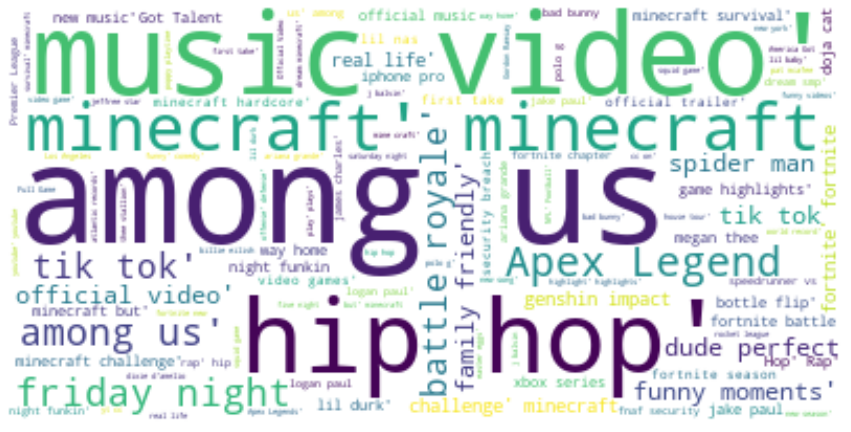

In [39]:
# create a text list of all words in column tags
text = " ".join(i for i in trending_copy.tags.astype(str))
# text = " ".join(i for i in data.text)

# set stopwords
stopwords = set(STOPWORDS)
stopwords.update(['None'])
# to update ex: stopwords.update(["bloom", "rose", "petals", "Average", "diameter","flushes", 'throughout', "Blooms", "form"])

# assign wordcloud
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

plt.figure( figsize=(15,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig("wordcloud_tags2.png")
plt.show()

Possible further exploration:
- word cloud of tags
- likes/dislikes ratio vs views
- are videos with more dislikes liekly to have their comments off?
- change false and true values to 1's and zeroes for the two bool vars
